#Strategy overview






##Description of indicators used

The main indicator that our strategy is using is a volatility indicator Bollinger Bands. It is a tool that uses the Simple Moving Average (SMA) and standard deviations of the close price to measure the relative high or low of a security’s price in relation to previous trades.

SMA is calculated by taking the average of close prices in the past n days, where n is the window size that can be varied. SMA smooths out the noise of short term daily trades and makes it easier to analyze the trend of the stock. Standard deviation of the current close price indicates the deviation from the mean close price. The larger the standard deviation, the larger the difference of the current close price and the mean close price.

When plotted on the graph, the Bollinger Bands consist of 3 lines: the middle line is the SMA line, the upper line which adds a multiple of the standard deviation of close price to the SMA, and the lower line which subtracts that from the MA.


##Description of strategy

Our strategy is based on two primary zones that we define using the Bollinger Bands: <br/><br/>

The **buy zone**, which constitutes of two areas
1. Trend following zone, which is between the upper Bollinger Band and a certain percentage higher than the simple moving average.
2. Reversal zone, which is the area lower than the lower Bollinger Band.

The **sell zone**, which constitutes of two areas
1. Trend following zone, which is between the lower Bollinger Band and a certain percentage lower than the simple moving average.
2. Reversal zone, which is the area higher than the upper Bollinger Band.

When the security’s price is in the buy zone, we will enter a long position. When the security’s price is in the sell zone, we will enter a short position. When the security’s price is no longer in any zone, we will close our position.
<br/><br/>
To put it concretely,

- Buy/Long when either of the following conditions are fullfilled:
 - MA + (BOLU - MA) * DF <= Closing Price < BOLU 
 - Closing Price <= BOLD

- Sell/Short when either of the following conditions are fullfilled:
  - BOLD < Closing Price <= MA - (MA - BOLD) * DF
  - Closing Price >= BOLU

where:
- **BOLU** = Upper Bollinger Band
- **BOLD** = Lower Bollinger Band
- **MA** = Moving Average
- **DF** = Distance Factor


#In sample backtesting

##Rule

Long when the close price is in the buy zone, and short if the close price is in the sell zone. Else close position if close price is not in any zone.

##Variables

The 3 variables that we will be tuning are:
1. Moving average window size
2. The number of times the standard deviation is added to and subtracted from the SMA
3. Distance factor.

##Parameters

The parameters for the variables are as follows:
- The moving average window size parameters are 10, 20, 30, 50, 100, 200

- The parameters for the number of standard deviations are 1.9, 2, 2.1, 2.3, 2.5

- The parameters for distance factor are from 0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.
<br/><br/>

The default moving average window size is 20. We vary the window size to capture different price trends. Reducing the window size allows us to capture more short-term price trends, while increasing the window size allows us to capture the long-term price trend and ignore short-term price fluctuations.<br/><br/>

However, as per Bollinger Bands Rules, the number of standard deviations is dependent on the moving average window size in order to ensure consistent price containment (Bollinger, n.d.). If the moving average window size is lengthened, the number of standard deviations needs to be increased; from 2 at 20 and 30 periods, to 2.1 at 50 periods. Likewise, if the average is shortened the number of standard deviations should be reduced; from 2 at 20 periods, to 1.9 at 10 periods.<br/><br/>

Distance factors between 0 to 1 are tested. A distance factor of 1 means that only when the price reaches the upper band or lower band, a signal will be generated. As the distance factor decreases, the number of signals that is generated is expected to increase as the buy zone and sell zone enlarge.<br/>

##Set up

###Imports

In [1]:
!pip install yfinance
!pip install ta

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 1.7 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for ta: filename=ta-0.10.2-py3-none-any.whl size=29104 sha256=108839a6550606ef7ae5450b24362d0739f671995807f528496218cd143adad7
  Stored in directory: /root/.cache/pip/wheels/31/31/f1/f2ff471bbc5b84a4b973698ceecdd453ae043971791adc3431
Successfully built ta


In [2]:
from ta.utils import dropna
from ta.volatility import BollingerBands
from ta.trend import ADXIndicator
from ta.volatility import AverageTrueRange
from ta.trend import SMAIndicator
from ta.momentum import RSIIndicator
from ta.volume import VolumeWeightedAveragePrice
import matplotlib.pyplot as plt
import yfinance as yf
import math
import pandas as pd
import numpy as np

###Strategy Class

In [3]:
class BollingerBandTrend():  

  # SMA_window, BB_std, distance_factor are variables that we will need to tune
  def __init__(self, symbol, start, end, interval, SMA_window, BB_std, distance_factor):

    self.symbol = symbol
    self.start = start
    self.end = end
    self.interval = interval
    self.SMA_window = SMA_window
    self.BB_std= BB_std
    self.distance_factor = distance_factor
    self.prepare_data()
    
  def prepare_data(self):

    stock_data = yf.Ticker(self.symbol)
    hist_stock = stock_data.history(start = self.start, end = self.end, interval = self.interval)

    # use BollingerBands indicator to get the upper bollinger band, lower bollinger band and the SMA
    indicator = BollingerBands(close = hist_stock["Close"], window=self.SMA_window, window_dev=self.BB_std)
    BBHBand = indicator.bollinger_hband()
    BBLBand = indicator.bollinger_lband()
    SMA = indicator.bollinger_mavg()

    bt_data = pd.DataFrame()
    bt_data["Close_Price"] = hist_stock["Close"]
    bt_data["BBHBand"] = BBHBand
    bt_data["BBLBand"] = BBLBand
    bt_data["SMA"] = SMA
    bt_data = bt_data.dropna()

    self.data = bt_data

  def strategy(self):

    # helper function to determine limit for trend following buy zone and sell zone
    def band_limit(df, distance_factor, is_buy_zone):
      if is_buy_zone:
        df["HBandLimit"] = df["SMA"] + (df["BBHBand"] - df["SMA"]) * distance_factor
        return df["HBandLimit"]
      else:
        df["LBandLimit"] = df["SMA"] - (df["SMA"] - df["BBLBand"]) * distance_factor
        return df["LBandLimit"]

    bt_data = self.data.copy()

    position = [0 for i in range(len(bt_data))]

    # we start off the strategy in the close position. i.e., position[0] = 0
    for i in range(1, len(bt_data)):
        previous_position = position[i-1]
        
        BBHBand = bt_data.iloc[i]["BBHBand"]
        BBLBand = bt_data.iloc[i]["BBLBand"]
        close_price = bt_data.iloc[i]["Close_Price"]
        upper_limit = band_limit(bt_data, self.distance_factor, True)[i]
        lower_limit = band_limit(bt_data, self.distance_factor, False)[i]

        if previous_position > 0: # prev long
          if ((close_price >= upper_limit) & (close_price < BBHBand)) or close_price <= lower_limit: # continue long
            position[i] = 1
          elif ((close_price <= lower_limit) & (close_price > BBLBand)) or close_price >= upper_limit: # short
            position[i] = -1
          else: # close
            position[i] = 0 
        elif previous_position < 0: # prev short
          if ((close_price <= lower_limit) & (close_price > BBLBand)) or close_price >= upper_limit: # continue short
            position[i] = -1
          elif ((close_price >= upper_limit) & (close_price < BBHBand)) or close_price <= lower_limit: # long
            position[i] = 1
          else: # close
            position[i] = 0
        else: # prev close
          if ((close_price >= upper_limit) & (close_price < BBHBand)) or close_price <= lower_limit: # enter long
            position[i] = 1
          elif ((close_price <= lower_limit) & (close_price > BBLBand)) or close_price >= upper_limit: # enter short
            position[i] = -1

    bt_data["Position"] = position
    bt_data["Signal"] = bt_data['Position'].diff()
    bt_data['Stock_Returns'] = np.log(bt_data["Close_Price"] / bt_data["Close_Price"].shift(1)) 
    bt_data["Strategy_Returns"] = bt_data["Stock_Returns"] * bt_data["Position"].shift(1)

    self.visualise_data = bt_data 
  
  def visualise_strategy(self):
    plt.figure(figsize=(45, 20))
    plt.plot(self.visualise_data["Close_Price"] ,color='black', label='Price', linestyle='dashed')
    plt.plot(self.visualise_data["BBHBand"], color='b', label='BBHBand')
    plt.plot(self.visualise_data["BBLBand"], color='r', label='BBLBand')
    plt.plot(self.visualise_data["HBandLimit"], color='y', label='HBandLimit', linestyle='dashdot')
    plt.plot(self.visualise_data["LBandLimit"], color='m', label='LBandLimit', linestyle='dashdot')
    plt.plot(self.visualise_data['SMA'], color='g', label='SMA')

    # we check for for both the position and the signal to determine whether it is a close/short/long
    # i.e., if the position is 1 and the signal is 1, then we are entering a long position
    # however, if the position is 0 and the signal is 1, then we aree closing from a short position
    plt.plot(self.visualise_data[(self.visualise_data['Signal'] == 1) & (self.visualise_data['Position'] == 1)].index, 
             self.visualise_data['Close_Price'][(self.visualise_data['Signal'] == 1) & (self.visualise_data['Position'] == 1)], 
             '^', 
             markersize = 15, 
             color = 'g', 
             label = 'buy/long')
    
    plt.plot(self.visualise_data[(self.visualise_data['Signal'] == -1) & (self.visualise_data['Position'] == -1)].index, 
             self.visualise_data['Close_Price'][(self.visualise_data['Signal'] == -1) & (self.visualise_data['Position'] == -1)], 
             'v', 
             markersize = 15, 
             color = 'r', 
             label = 'sell/short')
    
    plt.plot(self.visualise_data[((self.visualise_data['Signal'] == -1) | (self.visualise_data['Signal'] == 1)) & (self.visualise_data['Position'] == 0)].index, 
             self.visualise_data['Close_Price'][((self.visualise_data['Signal'] == -1) | (self.visualise_data['Signal'] == 1)) & (self.visualise_data['Position'] == 0)], 
             'o',
             markersize = 15, 
             color = 'blue', 
             label = 'close')

    plt.xlabel("Days")
    plt.ylabel("Price")
    plt.title("{} :: BBBand Trend Trading With {} MA, {} STD, and {} distance factor -- {} to {}".format(self.symbol, self.SMA_window, self.BB_std, self.distance_factor, self.start, self.end))
    plt.legend()
    plt.grid()
    plt.show()

    plt.figure(figsize=(15, 5))
    plt.plot(self.visualise_data["Position"])
    plt.title("{} :: Long/Short status -- {} to {}".format(self.symbol, self.start, self.end))
    plt.grid()
    plt.show()

  def performance(self):
    plt.figure(figsize=(15, 6))
    plt.hist(self.visualise_data["Stock_Returns"], bins = 40) 
    plt.title("{} :: Histogram of Stock Daily Log Returns -- {} to {}".format(self.symbol, self.start, self.end))
    plt.grid()
    plt.show()

  def returns_plot(self):
    self.visualise_data[["Stock_Returns", "Strategy_Returns"]].cumsum().apply(np.exp).plot(figsize=(15,6), title="{} :: Returns Plot -- {} to {}".format(self.symbol, self.start, self.end))

  def drawdown_plot(self):
    self.visualise_data["Gross_Cum_Returns"] = self.visualise_data["Strategy_Returns"].cumsum().apply(np.exp)
    self.visualise_data["Cum_Max"] = self.visualise_data["Gross_Cum_Returns"].cummax()
    self.visualise_data[["Gross_Cum_Returns", "Cum_Max"]].dropna().plot(figsize =(15,6), title="{} :: Drawdown Plot -- {} to {}".format(self.symbol, self.start, self.end))

  # return the total stock returns
  def stock_return(self):
    return np.exp(self.visualise_data["Stock_Returns"].sum())-1
  
  # return the total strategy returns
  def strategy_return(self):
    return np.exp(self.visualise_data["Strategy_Returns"].sum())-1

  def annual_returns(self):
    avg_returns = self.visualise_data["Strategy_Returns"].mean()
    return np.exp(avg_returns*252)-1

  def strategy_standard_deviation(self):
    std_dev = (self.visualise_data["Strategy_Returns"].std()) * 100
    std_dev = round(std_dev, 2)
    return std_dev

  def stock_standard_deviation(self):
    stock_std_dev = (self.visualise_data["Stock_Returns"].std()) * 100
    stock_std_dev = round(stock_std_dev, 2)
    return stock_std_dev

  def sharpe(self):
    avg_returns = self.visualise_data["Strategy_Returns"].mean()
    std = self.visualise_data["Strategy_Returns"].std()
    daily_SR = avg_returns / std
    annual_SR = daily_SR * (252 ** 0.5)
    annual_SR = round(annual_SR, 2)
    return annual_SR

  def sortino(self):
    negative_returns_dataframe = self.visualise_data[self.visualise_data["Strategy_Returns"]<0]
    negative_returns = negative_returns_dataframe["Strategy_Returns"]
    negative_regular_returns = np.exp(negative_returns)-1
    annual_negative_sd = negative_regular_returns.std() * (252 ** 0.5)
    annual_Sortino = self.annual_returns()/annual_negative_sd
    annual_Sortino = round(annual_Sortino, 2)
    return annual_Sortino

  def max_drawdown(self):
    self.visualise_data["Gross_Cum_Returns"] = self.visualise_data["Strategy_Returns"].cumsum().apply(np.exp) 
    self.visualise_data["Cum_Max"] = self.visualise_data["Gross_Cum_Returns"].cummax()
    drawdown = self.visualise_data["Cum_Max"] - self.visualise_data["Gross_Cum_Returns"] # it gives the difference between orange and blue
    self.visualise_data["drawdown"] = drawdown
    return round(self.visualise_data["drawdown"].max(),2)

  def calmar(self):
    calmars = self.annual_returns()/abs(self.max_drawdown())
    calmars = round(calmars, 2)
    return calmars

##Training

####Parameters

We will define the range of parameters that we will train using all available data from "2015-01-01" to "2019-12-31" across the FAANG stocks

In [4]:
# MA windows and corresponding std
bb_vars = [(10, 1.9), (20, 2), (30, 2), (50, 2.1), (100, 2.3), (200, 2.5)]

# distance vector
distance_factors = [0, 0.1, 0.3, 0.5, 0.7, 0.9, 1]

# FAANG tickers
tickers = ["AAPL", "META", "AMZN", "NFLX", "GOOG"]

####Grid Search

We will perform a grid search on our defined parameters, which is an algorithm that generates all possible combinations.

In each combination, we will calculate the returns and other metrics of the strategy using 4 years of daily stock data (2015 to 2019) for each of the FAANG stock. To determine the optimal combination of parameters, we will use the average strategy return as the metrics of comparsion across different combinations.<br/><br/>

The average strategy return will be calculated as below:
- sum of strategy return for stock i / total number of stocks

where:
- stock i is a FANNG stock
- number of stocks = 5

In [5]:
# cache to store optimal parameters
optimal_parameters = {}
optimal_parameters["Average Strategy Return"] = None

if __name__ == '__main__':
  
  # loop through each of the window length and std
  for j in range(len(bb_vars)):
    current_sma_window = bb_vars[j][0]
    current_bb_std = bb_vars[j][1]

    # loop through each distance factor
    for k in range(len(distance_factors)):
      current_distance_factor = distance_factors[k]
      total_strat_return = 0
      total_stock_return = 0

      print("--------------------------------MA Window: {}, STD: {}, Distance Factor: {}------------------------------------------------\n".format(current_sma_window, current_bb_std, current_distance_factor))
      
      # loop through each FANNG stock
      # for each stock, calculate return for each FANNG stock using the defined strategy class and current combination of parameters
      for i in range(len(tickers)):
        ticker = tickers[i]

        # get the returns of the strategy using the current combination of parameters
        output = BollingerBandTrend(symbol=ticker, start="2015-01-01", end="2019-12-31", interval="1d", SMA_window=current_sma_window, BB_std=current_bb_std, distance_factor=current_distance_factor)
        output.strategy()

        # calculate total strat return
        total_strat_return += output.strategy_return()
        # calculate total stock return
        total_stock_return += output.stock_return()

        print("Ticker: {}, Strategy Return: {}, Stock Return:{}\n".format(ticker, output.strategy_return(),output.stock_return()))

      # calculate average strategy return
      average_strat_return = total_strat_return / len(tickers)
      # calculate average stock return
      average_stock_return = total_stock_return / len(tickers)

      # add result to cache
      if optimal_parameters["Average Strategy Return"] is None or optimal_parameters["Average Strategy Return"] < average_strat_return:
        optimal_parameters["MA Window"] = current_sma_window
        optimal_parameters["STD"] = current_bb_std
        optimal_parameters["Distance Factor"] = current_distance_factor
        optimal_parameters["Average Stock Return"] = average_stock_return
        optimal_parameters["Average Strategy Return"] = average_strat_return

      print("Average Strategy Return: {}\n".format(average_strat_return))
      print("Average Stock Return: {}\n".format(average_stock_return))


  print("-----------------------------Optimal Parameters---------------------------------------------------")
  print(optimal_parameters)

--------------------------------MA Window: 10, STD: 1.9, Distance Factor: 0------------------------------------------------

Ticker: AAPL, Strategy Return: -0.7144805699811897, Stock Return:1.9702069007036727

Ticker: META, Strategy Return: 0.3281124580462498, Stock Return:1.7604320761369272

Ticker: AMZN, Strategy Return: 0.3557282196065483, Stock Return:5.436278004025939

Ticker: NFLX, Strategy Return: -0.6296021643640339, Stock Return:5.990270224796247

Ticker: GOOG, Strategy Return: 0.5619704435398265, Stock Return:1.6700579077409587

Average Strategy Return: -0.019654322630519805

Average Stock Return: 3.3654490226807487

--------------------------------MA Window: 10, STD: 1.9, Distance Factor: 0.1------------------------------------------------

Ticker: AAPL, Strategy Return: -0.6054810311123979, Stock Return:1.970205642710106

Ticker: META, Strategy Return: 0.9120367915602756, Stock Return:1.7604320761369272

Ticker: AMZN, Strategy Return: 0.45645111699510954, Stock Return:5.436

##Training results

From the grid search, we can see that a MA window of size 20, with std 2, and a distance factor of 0.1 gives the highest average strategy return.

##Testing of optimal variables

To perform testing, we will test the optimal parameters using a year worth of daily stock data across 4 years, from "2015-01-01" to "2019-12-31".

In each year, we will test the optimal variables on each of the FANNG stock and record the performance on the stock.

In [6]:
# define test period
test_periods = [("2015-01-01", "2015-12-31"),("2016-01-01", "2016-12-31"),("2017-01-01", "2017-12-31"),("2018-01-01", "2018-12-31"),("2019-01-01", "2019-12-31")]

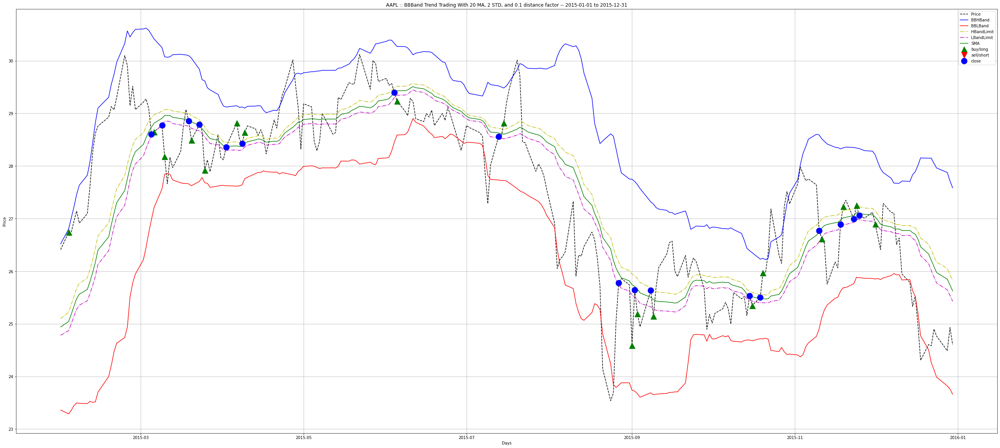

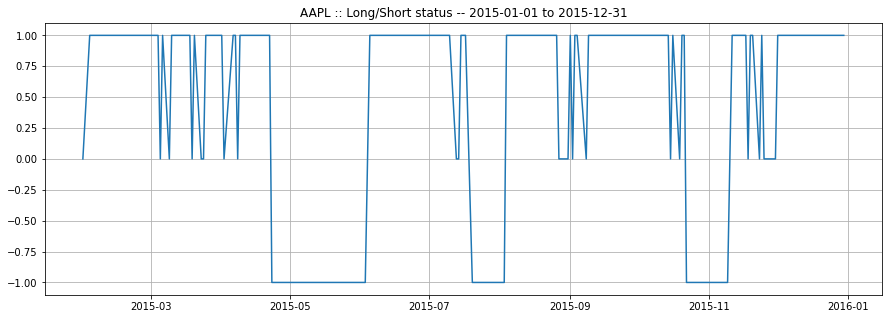

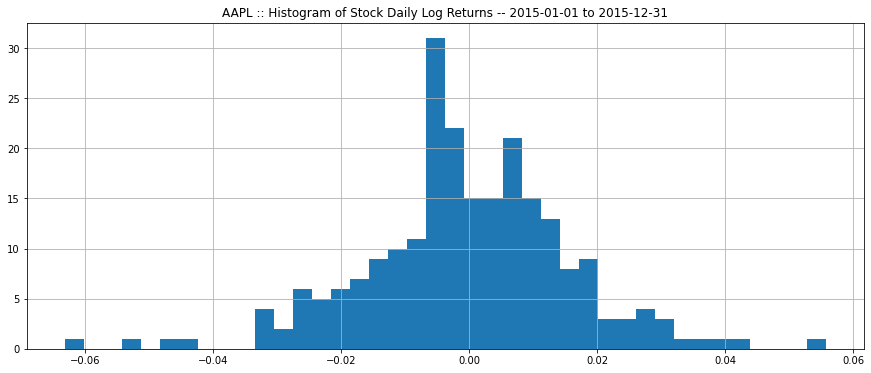

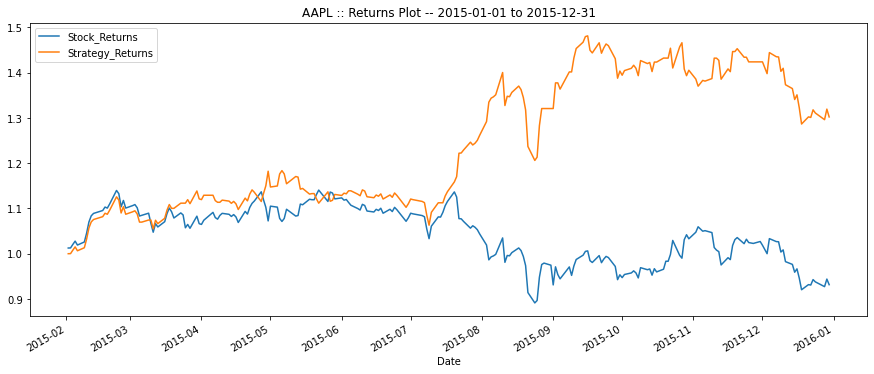

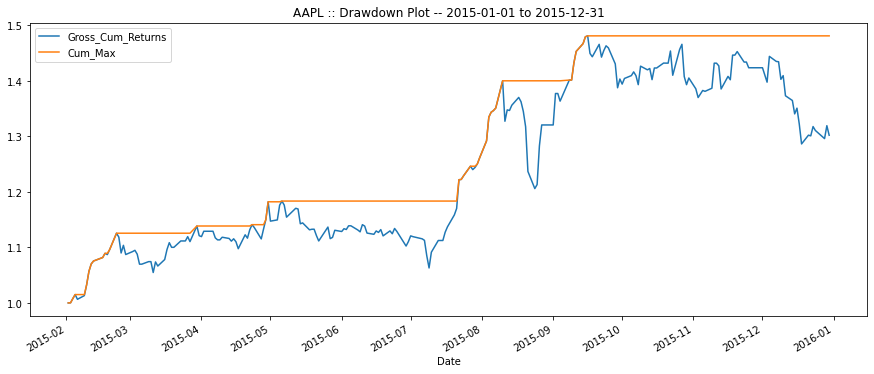

...

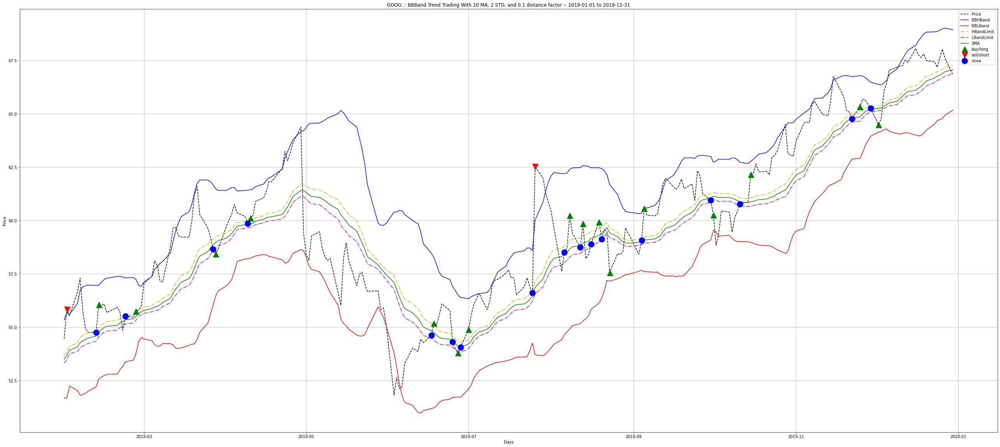

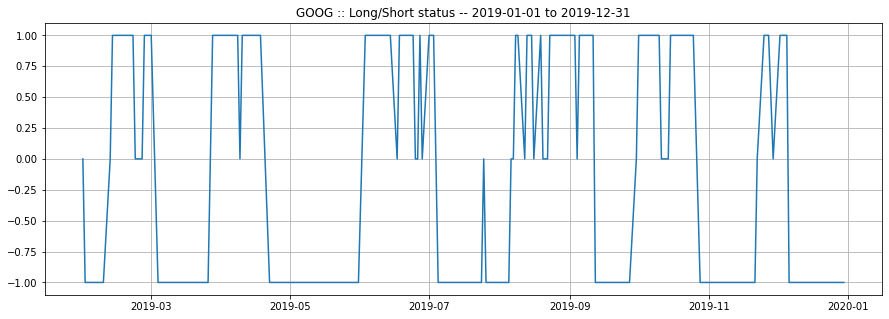

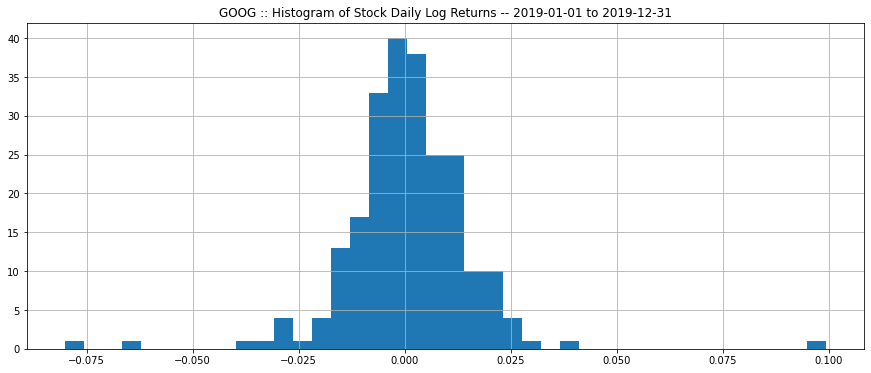

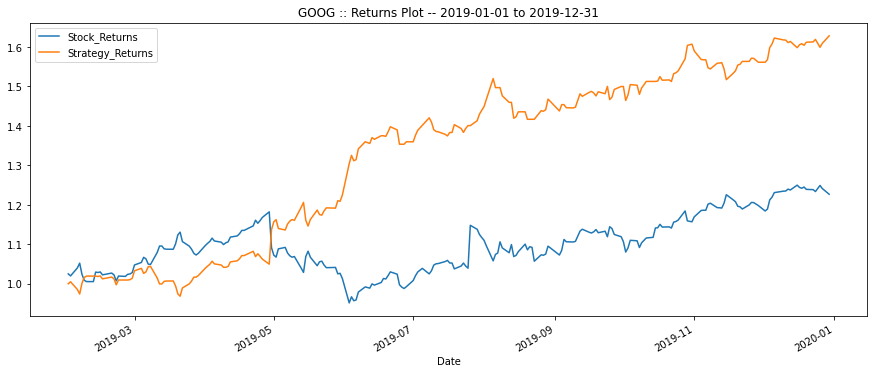

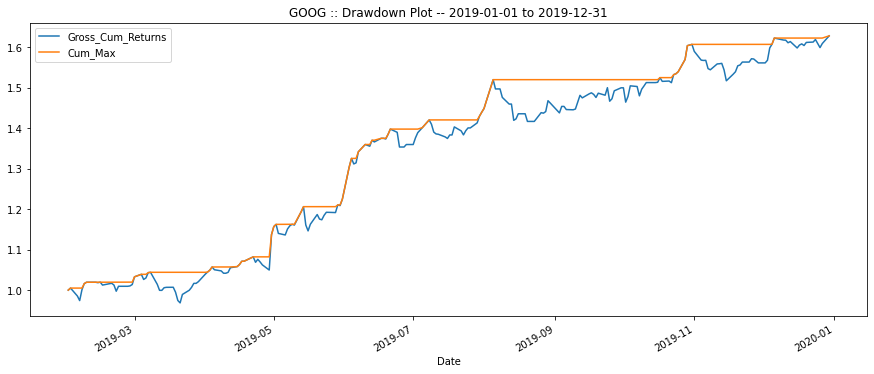

In [7]:
data = {}

if __name__ == '__main__':

  # loop through each ticker
  for i in range(len(tickers)):
    ticker = tickers[i]

    data[ticker] = {}

    # loop through each test year
    for j in range(len(test_periods)):
      period = test_periods[j]
      
      # instantiate an instance of the main class Backtester
      # output = BollingerBandTrend(symbol=ticker, start=period[0], end=period[1], interval="1d", SMA_window=20, BB_std=2, distance_factor=0.1)
      output = BollingerBandTrend(symbol=ticker, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
      
      #run the strategy
      output.strategy()

      #visualise the strategy
      output.visualise_strategy()

      #get the performance
      output.performance()

      #plot the returns
      output.returns_plot()

      #plot the drawdown
      output.drawdown_plot()

      #adds the metrics to the dictionary
      data[ticker][f'{period[0].split(" ")[0].split("-")[0]}'] = pd.Series([output.strategy_return(),output.stock_return(),output.strategy_standard_deviation(),output.stock_standard_deviation(),output.sharpe(),output.sortino(),output.calmar(),output.max_drawdown()],
                      index=['Strategy Returns','Stock Return','Strategy Standard Deviation','Stock Standard Deviation','Sharpe Ratio','Sortino', 'Calmar', 'Max Drawdown'])

In [8]:
for key in data:
  print(f'TABLE: {key}')
  metrics = pd.DataFrame(data[key])
  print(metrics)
  print()

TABLE: AAPL
                                 2015      2016      2017      2018      2019
Strategy Returns             0.302016  0.156329 -0.137211 -0.110922  0.057491
Stock Return                -0.068380  0.227802  0.416987 -0.050275  0.790621
Strategy Standard Deviation  1.540000  1.290000  1.070000  1.750000  1.400000
Stock Standard Deviation     1.610000  1.320000  1.140000  1.870000  1.450000
Sharpe Ratio                 1.180000  0.770000 -0.950000 -0.460000  0.270000
Sortino                      1.930000  1.390000 -1.400000 -0.580000  0.480000
Calmar                       1.760000  1.310000 -0.740000 -0.260000  0.200000
Max Drawdown                 0.190000  0.130000  0.200000  0.460000  0.320000

TABLE: META
                                 2015      2016      2017      2018      2019
Strategy Returns             0.172043  0.153738  0.021821 -0.107508  0.789493
Stock Return                 0.399289 -0.000347  0.354052 -0.288157  0.358928
Strategy Standard Deviation  1.600000  

#Evaluation of strategy

In [18]:
for j in test_periods:
  period = j
  stock_name = []
  std_dev_value = []
  sharpe_value = []
  sortino_value = []
  calmar_value = []
  max_drawdown = []
  annual_returns = []
  for i in tickers:
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=20, BB_std=2, distance_factor=0.1)
    output.strategy()
    std_dev_value.append(output.strategy_standard_deviation())
    sharpe_value.append(output.sharpe())
    sortino_value.append(output.sortino())
    calmar_value.append(output.calmar())
    max_drawdown.append(output.max_drawdown())
    annual_returns.append(output.strategy_return())
    stock_name.append(i)

    output_df = pd.DataFrame()
    output_df['STOCK'] = stock_name
    output_df['STD DEV (%)'] = std_dev_value
    output_df['SHARPE'] = sharpe_value
    output_df['SORTINO'] = sortino_value
    output_df['CALMAR'] = calmar_value
    output_df['MAX DRAWDOWN'] = max_drawdown
    output_df['ANNUAL STRAT RETURNS'] = annual_returns

  print("Table for ratios for {} to {}".format(period[0], period[1]))
  print(output_df)
  print("\n\n")

Table for ratios for 2015-01-01 to 2015-12-31
  STOCK  STD DEV (%)  SHARPE  SORTINO  CALMAR  MAX DRAWDOWN  \
0  AAPL         1.54    1.18     1.93    1.76          0.19   
1  META         1.60    0.68     1.01    0.65          0.29   
2  AMZN         1.89   -0.18    -0.20   -0.20          0.26   
3  NFLX         2.95    0.44     0.60    0.51          0.45   
4  GOOG         1.75    0.00     0.00    0.00          0.29   

   ANNUAL STRAT RETURNS  
0              0.302020  
1              0.172043  
2             -0.048059  
3              0.210521  
4              0.000560  



Table for ratios for 2016-01-01 to 2016-12-31
  STOCK  STD DEV (%)  SHARPE  SORTINO  CALMAR  MAX DRAWDOWN  \
0  AAPL         1.29    0.77     1.39    1.31          0.13   
1  META         1.32    0.74     1.17    1.05          0.16   
2  AMZN         1.56   -0.33    -0.38   -0.36          0.22   
3  NFLX         2.31    0.95     1.50    2.44          0.17   
4  GOOG         1.08    2.49     4.49    5.93          

##Returns

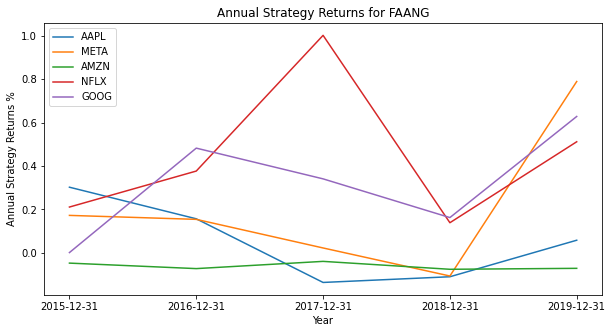

In [10]:
plt.figure(figsize=(10, 5))
for i in tickers:
  year = []
  annual_returns = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    annual_returns.append(output.strategy_return())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['annual_returns'] = annual_returns

  plt.plot(output_df['year'], output_df['annual_returns'], label=i)
plt.xlabel("Year")
plt.ylabel("Annual Strategy Returns %")
plt.title("Annual Strategy Returns for FAANG")
plt.legend()
plt.show()

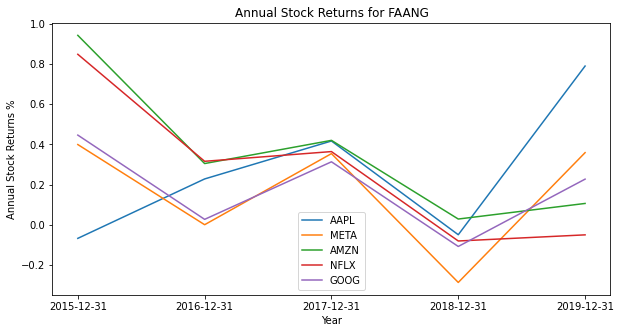

In [11]:
plt.figure(figsize=(10, 5))
for i in tickers:
  year = []
  annual_returns = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    annual_returns.append(output.stock_return())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['annual_returns'] = annual_returns

  plt.plot(output_df['year'], output_df['annual_returns'], label=i)
plt.xlabel("Year")
plt.ylabel("Annual Stock Returns %")
plt.title("Annual Stock Returns for FAANG")
plt.legend()
plt.show()

##Risks

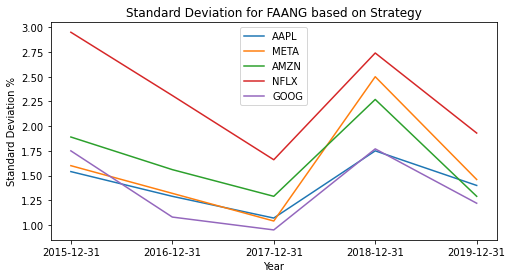

In [12]:
plt.figure(figsize=(8, 4))
for i in tickers:
  year = []
  std_dev_value = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    std_dev_value.append(output.strategy_standard_deviation())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['std_dev(%)'] = std_dev_value

  plt.plot(output_df['year'], output_df['std_dev(%)'], label=i)

plt.xlabel("Year")
plt.ylabel("Standard Deviation %")
plt.title("Standard Deviation for FAANG based on Strategy")
plt.legend()
plt.show()

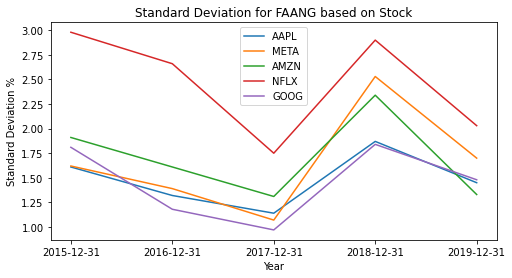

In [13]:
plt.figure(figsize=(8, 4))
for i in tickers:
  year = []
  std_dev_value = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    std_dev_value.append(output.stock_standard_deviation())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['std_dev(%)'] = std_dev_value
  plt.plot(output_df['year'], output_df['std_dev(%)'], label=i)

plt.xlabel("Year")
plt.ylabel("Standard Deviation %")
plt.title("Standard Deviation for FAANG based on Stock")
plt.legend()
plt.show()

##Sharpe

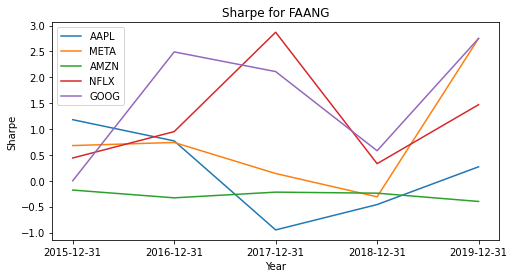

In [14]:
plt.figure(figsize=(8, 4))
for i in tickers:
  year = []
  sharpe = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    sharpe.append(output.sharpe())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['sharpe'] = sharpe
     
  plt.plot(output_df['year'], output_df['sharpe'], label=i)
  plt.xlabel("Year")
plt.ylabel("Sharpe")
plt.title("Sharpe for FAANG")
plt.legend()
plt.show()

##Performance Metrics

### Sortino

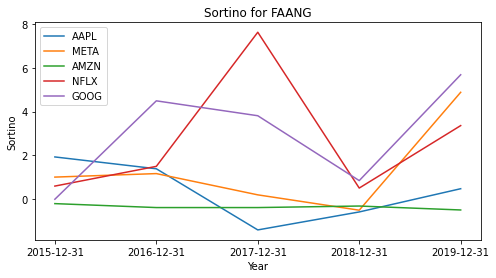

In [15]:
plt.figure(figsize=(8, 4))
for i in tickers:
  year = []
  sortino = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    sortino.append(output.sortino())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['sortino'] = sortino
      
  plt.plot(output_df['year'], output_df['sortino'], label=i)
  
plt.xlabel("Year")
plt.ylabel("Sortino")
plt.title("Sortino for FAANG")
plt.legend()
plt.show()

### Max Drawdown

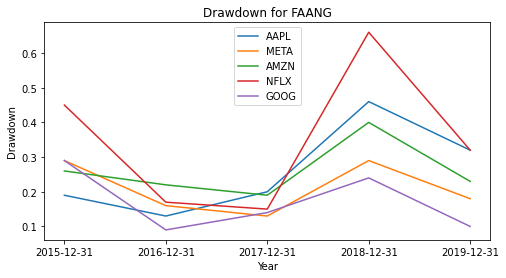

In [16]:
plt.figure(figsize=(8, 4))
for i in tickers:
  year = []
  drawdown = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    drawdown.append(output.max_drawdown())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['drawdown'] = drawdown
    
  plt.plot(output_df['year'], output_df['drawdown'], label=i)
  plt.xlabel("Year")

plt.ylabel("Drawdown")
plt.title("Drawdown for FAANG")
plt.legend()
plt.show()

### Calmar

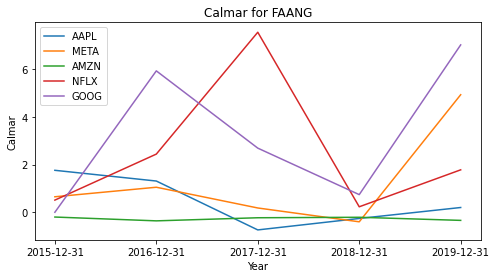

In [17]:
plt.figure(figsize=(8, 4))
for i in tickers:
  year = []
  calmar = []
  for j in test_periods:
    period = j
    output = BollingerBandTrend(symbol=i, start=period[0], end=period[1], interval="1d", SMA_window=optimal_parameters["MA Window"], BB_std=optimal_parameters["STD"], distance_factor=optimal_parameters["Distance Factor"])
    output.strategy()
    year.append(period[1])
    calmar.append(output.calmar())

    output_df = pd.DataFrame()
    output_df['year'] = year
    output_df['calmar'] = calmar
    
  plt.plot(output_df['year'], output_df['calmar'], label=i)

plt.xlabel("Year")
plt.ylabel("Calmar")
plt.title("Calmar for FAANG")
plt.legend()
plt.show()